In [906]:
import sklearn
import sklearn.cluster, sklearn.datasets
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import umap
import sklearn.preprocessing
import pandas as pd
from tqdm.auto import tqdm
import math
from scipy.special import gamma
import umap
import scipy
from importlib import reload
import py_subclu as ps

In [907]:
reload(ps)

<module 'py_subclu' from 'C:\\Users\\emmanuel.doumard\\Documents\\These\\Subspace_Clustering\\python_subclu\\py_subclu.py'>

In [30]:
iris = sklearn.datasets.load_iris(as_frame=True)

In [780]:
neighbours = np.sum(scipy.spatial.distance.squareform(scipy.spatial.distance.pdist(iris.data))<=0.5,axis=0) #1D-array with the number of neighbours of each point
neighbours[neighbours>=5].sum()

1537

In [776]:
np.sum(scipy.spatial.distance.squareform(scipy.spatial.distance.pdist(iris.data))<=0.5,axis=0)[dbscan.core_sample_indices_]

array([25, 18, 22, 17, 20, 11, 20, 33, 11, 22, 18, 30, 19,  5, 11, 25, 20,
       13, 23, 19,  8, 19, 30, 24, 26, 23, 21, 17,  8,  6, 24, 23, 11, 20,
       11, 31, 24, 11, 16,  7, 20, 20, 20, 23, 29,  5, 12,  5,  7, 14, 14,
        9,  9, 12, 15,  8,  9, 12, 11,  6, 10,  9,  6, 10,  9,  8,  6, 12,
        6,  8,  6, 14, 12,  5,  5, 11, 12, 13,  8, 13, 14, 15, 13, 16, 12,
       14,  8,  5,  7, 10,  7, 10, 13,  7, 10,  9,  6, 10,  8,  5, 12, 12,
        9,  9,  8,  5,  7, 13,  8, 11,  8,  8,  7,  8,  6, 13,  9])

In [767]:
dbscan = sklearn.cluster.DBSCAN(eps=0.5, min_samples=5).fit(iris.data)

In [769]:
dbscan.core_sample_indices_

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  16,  17,  19,  20,  21,  23,  24,  25,  26,  27,  28,  29,
        30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  42,  43,
        44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,  55,  56,
        58,  61,  63,  65,  66,  67,  69,  70,  71,  72,  73,  74,  75,
        76,  77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  88,  89,
        90,  91,  92,  94,  95,  96,  97,  99, 101, 102, 103, 104, 110,
       111, 112, 115, 116, 120, 121, 123, 124, 125, 126, 127, 128, 132,
       133, 136, 137, 138, 139, 140, 142, 143, 144, 145, 146, 147, 149],
      dtype=int64)

# Methods

In [894]:
## Generate clusters on a dataframe X using DBSCAN
def generate_dbscan_clusters(X, eps, m):
    C = []
    dbscan = sklearn.cluster.DBSCAN(eps=eps,min_samples=m).fit(X)
    for label in np.unique(dbscan.labels_):
        if label!=-1: # -1 means sample is not in a cluster
            C.append(X.iloc[np.where(dbscan.labels_==label)])
    return C

## Generate all 1-D clusters
# A cluster is a slice of a matrix or DataFrame on indices (objects) and features (columns)

def generate_1D_clusters(X, eps, m):
    C = []
    S = set()
    for a in X.columns:
        C1 = generate_dbscan_clusters(X.loc[:,[a]], eps=eps, m=m)
        for clust in C1:
            C.append(clust)
            S.add(frozenset({a})) # frozenset because sets are mutable (thus non hashable)
    return C, S

def generate_candidates(Sk):
    """
    Generate (k+1)-Dimensional candidates from k-dimensional subspaces
    by merging subspaces sharing k-1 common attributes 
    and pruning irrelevant candidates
    Irrelevant candidates are candidates that contains k-dimensional subspaces
    that are not included in Sk
    """
    
    cands = set()
    for s1 in Sk:
        for s2 in Sk:
            if s1!=s2:
                if len(s1.intersection(s2))==(len(s1)-1): # if s1 and s2 share k-1 features
                    cands.add(s1.union(s2))
    #Prune irrelevant candidates
    to_prune = set()
    for cand in cands:
        for a in cand:
            s = cand.difference(set({a}))
            if not s in Sk:
                print("pruning candidate : ",cand)
                to_prune.add(cand)
                break
    cands -= to_prune
    return cands

def generate_clusters(X, C, Sk, cands, eps, m):
    """
    Generate (k+1)-dimensional clusters (C_k+1) from :
     - k-dimensional clusters (C_k)
     - (k+1)-dimensional candidate subspaces (cands)
     - k-dimensional subspaces
    """
    
    cl_cand = [] # Ck+1
    s_cands = set() # Sk+1
    for cand in (pbar := tqdm(cands)):
        bestS=list(cand)[0]
        minObj = np.inf
        
        for a in cand:  
            s = cand.difference(set({a}))  #Every subspace of cand of dim k is part of Sk (thanks to the pruning step)
            #count the number of objects in this k-dim subspace of that candidate
            nObjInCS = 0
            for clust in C:
                if set(clust.columns)==s:
                    nObjInCS+=clust.shape[0]
            if nObjInCS<minObj:
                bestS = s
                minObj = nObjInCS
        
        #print("Best subspace : ", s)
        
        for clust in C:
            if set(clust.columns)==bestS: #clust in best subspace
                cl_dbscan_cand = generate_dbscan_clusters(X.loc[clust.index,cand], eps, m)
                for cl in cl_dbscan_cand:
                    cl_cand.append(cl)
                    s_cands.add(frozenset(cl.columns))
                    
    return cl_cand, s_cands

def SUBCLU(X, eps, m):
    C1, S1 = generate_1D_clusters(X,eps,m)
    
    C = [C1]
    S = [S1]
    
    while len(C[-1])>0:
        print("Computing {}-dim clusters".format(len(C)+1))
        cands = generate_candidates(S[-1])
        Ck, Sk = generate_clusters(X, C[-1], S[-1], cands, eps, m)
        C.append(Ck)
        S.append(Sk)
    return C, S

def qualityS(C, S, eps, n):
    """
    Old version
    """
    
    clusterized_points = set()
    for cl in C:
        if set(cl.columns) == S:
            clusterized_points.update(cl.index)
    countS = len(clusterized_points)
    d=len(S)
    
    return countS / (n**2 * ((math.sqrt(math.pi**d) / gamma(d/2 + 1)) * (eps**d)))

def qualityS2(X, S, eps, m):
    """
    Computes the quality of a subspace (no need of its clusters)
    Formula written in the RIS paper (Kailing 2003)
    """
    
    neighbors = np.sum(scipy.spatial.distance.squareform(scipy.spatial.distance.pdist(X.loc[:,S]))<=eps,axis=0) #1D-array with the number of neighbours of each point in S
    countS = neighbors[neighbors>=m].sum() #Sum of all neighbors in neighborhood of core objects
    d=len(S)
    return countS / (X.shape[0]**2 * ((math.sqrt(math.pi**d) / gamma(d/2 + 1)) * (eps**d)))
    
def allSubspacesQuality(X, S, eps, m):
    dictSubspacesQuality = dict()
    for s in S:
        dictSubspacesQuality[s] = qualityS2(X, s, eps, m)
    return dictSubspacesQuality

def clusters_list_to_dataframe(C,Q):
    """
    Create a dataframe to store all relevant informations about a cluster and its corresponding subspace
    """
    
    df = pd.DataFrame(columns=["Cluster","Number of instances","Subspace","Subspace quality","Subspace size","Indices"])
    C = [cl for sublist in C for cl in sublist]
    for i,cl in enumerate(C):
        df.loc[i,"Cluster"]=cl.values
        df.loc[i,"Number of instances"]=cl.shape[0]
        df.loc[i,"Subspace size"]=cl.shape[1]
        df.loc[i,"Subspace"]=set(cl.columns)
        df.loc[i,"Subspace quality"]=Q[frozenset(cl.columns)]
        df.loc[i,"Indices"]=cl.index
    return df

def draw_subspaces_clusters(X,df_C,limit=None):
    """
    Draw a figure for each subspace, coloring each dataset
    Using UMAP for subspaces of dimension > 2
    """
    
    subspaces_ordered_list = df_C.sort_values("Subspace quality",ascending=False)["Subspace"].drop_duplicates()
    X_scaled = pd.DataFrame(sklearn.preprocessing.StandardScaler().fit_transform(X),columns=X.columns)
    
    if not limit:
        limit=subspaces_ordered_list.shape[0]
    for s in subspaces_ordered_list[:limit]:
        fig = plt.figure(figsize=(9,4))
        if len(s)==1: ## 1-Dim subspaces
            rand_jitter = (np.random.rand(X.shape[0])-0.5)*0.2
            plt.ylim([-1,1])
            plt.xlabel(list(s)[0])
            plt.ylabel("Jitter")
            plt.scatter(x=X.loc[:,s],y=rand_jitter)
            for ic in df_C.loc[df_C["Subspace"]==s,"Indices"]:
                plt.scatter(x=X.loc[ic,s],y=rand_jitter[ic])
        
        elif len(s)==2: ## 2-Dim subspaces
            labels = list(s)
            x_label = labels[0]
            y_label = labels[1]
            plt.xlabel(x_label)
            plt.ylabel(y_label)
            plt.scatter(x=X.loc[:,x_label],y=X.loc[:,y_label])
            for ic in df_C.loc[df_C["Subspace"]==s,"Indices"]:
                plt.scatter(x=X.loc[ic,x_label],y=X.loc[ic,y_label])
        
        elif len(s)==3: ## 3-dim subspaces
            plt.gcf().set_size_inches(18.5,10.5)
            ax = fig.add_subplot(1,2,1,projection="3d")
            labels = list(s)
            x_label = labels[0]
            y_label = labels[1]
            z_label = labels[2]
            ax.set_xlabel(x_label)
            ax.set_ylabel(y_label)
            ax.set_zlabel(z_label)
            total_ic=[]
            for i,ic in enumerate(df_C.loc[df_C["Subspace"]==s,"Indices"]):
                ax.scatter(xs=X.loc[ic,x_label],ys=X.loc[ic,y_label],zs=X.loc[ic,z_label],c=plt.rcParams['axes.prop_cycle'].by_key()['color'][i+1])
                total_ic.append(ic)
            nc = np.setdiff1d(X.index,np.array([ic for sublist in total_ic for ic in sublist]))
            ax.scatter(xs=X.loc[nc,x_label],ys=X.loc[nc,y_label],zs=X.loc[nc,z_label])
            
            ax2 = fig.add_subplot(1,2,2)
            reducer = umap.UMAP().fit(X_scaled.loc[:,s])
            ax2.set_xlabel("UMAP X")
            ax2.set_ylabel("UMAP Y")
            ax2.scatter(x=reducer.embedding_[:,0],y=reducer.embedding_[:,1])
            for ic in df_C.loc[df_C["Subspace"]==s,"Indices"]:
                ax2.scatter(x=reducer.embedding_[ic,0],y=reducer.embedding_[ic,1])
                
        else : ## >3-dim subspaces
            reducer = umap.UMAP().fit(X_scaled.loc[:,s])
            plt.xlabel("UMAP X")
            plt.ylabel("UMAP Y")
            plt.scatter(x=reducer.embedding_[:,0],y=reducer.embedding_[:,1])
            for ic in df_C.loc[df_C["Subspace"]==s,"Indices"]:
                plt.scatter(x=reducer.embedding_[ic,0],y=reducer.embedding_[ic,1])
        plt.title("Subspace " + str(s) + " with quality "+ str(df_C.loc[df_C["Subspace"]==s,"Subspace quality"].mean()))
        plt.show()

In [872]:
np.array([[1,2,3],[4,5,6]]).flatten()

array([1, 2, 3, 4, 5, 6])

In [90]:
dbscan = sklearn.cluster.DBSCAN(eps=0.000001, min_samples=15).fit(iris.data.iloc[:,[0]])
np.unique(dbscan.labels_,return_counts=True)

(array([-1], dtype=int64), array([150], dtype=int64))

In [389]:
dbscan = sklearn.cluster.DBSCAN(eps=0.1,min_samples=15).fit(iris.data)

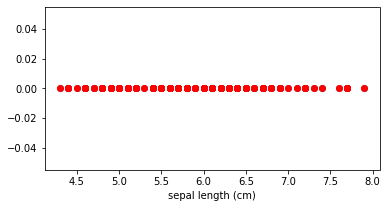

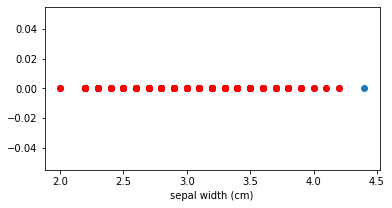

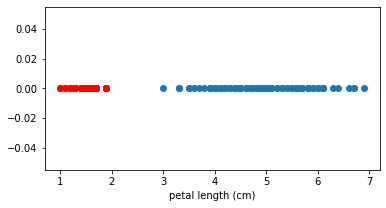

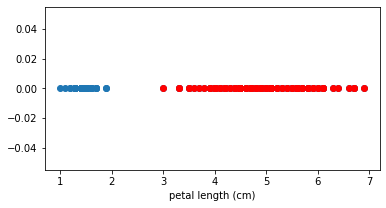

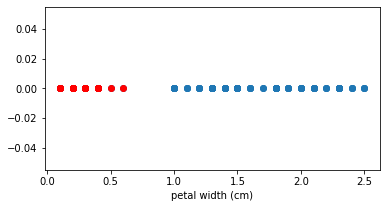

...

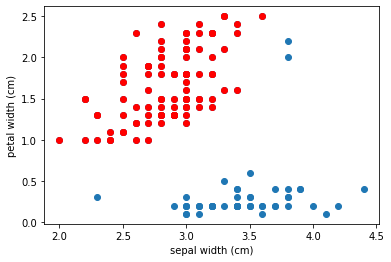

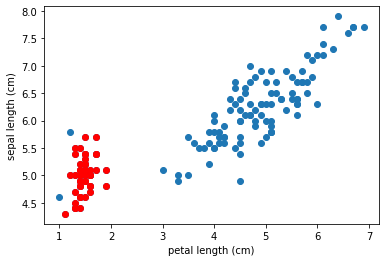

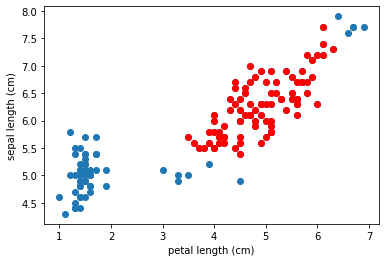

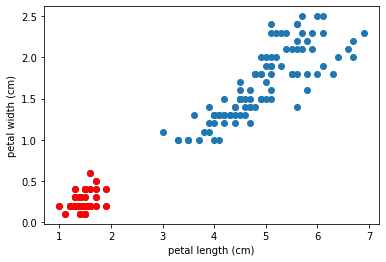

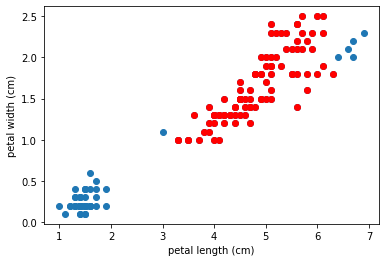

In [489]:
C, S = SUBCLU(iris.data, eps=0.3, m=5)
for cl in C[0]:
    plt.figure(figsize=(6,3))
    plt.scatter(x=iris.data.loc[:,cl.columns[0]],y=np.zeros(iris.data.shape[0]))
    plt.scatter(x=cl.loc[:,cl.columns[0]],y=np.zeros(cl.shape[0]),color='r')
    plt.xlabel(cl.columns[0])
    
for cl in C[1]:
    plt.figure()
    plt.scatter(x=iris.data.loc[:,cl.columns[0]],y=iris.data.loc[:,cl.columns[1]])
    plt.scatter(x=cl.loc[:,cl.columns[0]],y=cl.loc[:,cl.columns[1]],color='r')
    plt.xlabel(cl.columns[0])
    plt.ylabel(cl.columns[1])

In [460]:
dbscan = sklearn.cluster.DBSCAN(eps=0.5,min_samples=5).fit(iris.data)

In [471]:
reducer = umap.UMAP().fit(sklearn.preprocessing.StandardScaler().fit_transform(iris.data))

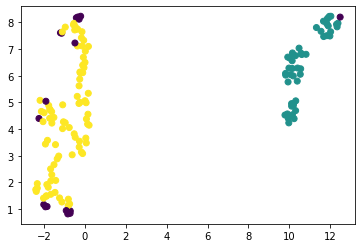

In [487]:
plt.scatter(x=reducer.embedding_[:,0],y=reducer.embedding_[:,1],c=dbscan.labels_)

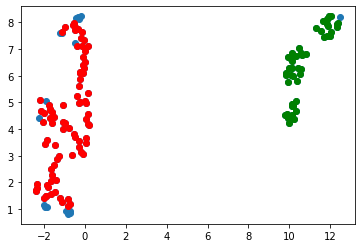

In [488]:
C, S = SUBCLU(iris.data, eps=0.5, m=5)
plt.figure()
plt.scatter(x=reducer.embedding_[:,0],y=reducer.embedding_[:,1])
for i,cl in enumerate(C[3]):
    plt.scatter(x=reducer.embedding_[cl.index,0],y=reducer.embedding_[cl.index,1],color=['g','r','y'][i])

In [500]:
digits = sklearn.datasets.load_digits(as_frame=True)
digits.data.shape

(1797, 64)

In [521]:
C, S = SUBCLU(digits.data, eps=0.01, m=20)

Computing 2-dim clusters


  0%|          | 0/2016 [00:00<?, ?it/s]

Computing 3-dim clusters


  0%|          | 0/41664 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [508]:
len(C)

10

In [516]:
dbscan.core_sample_indices_

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  16,  17,  19,  20,  21,  23,  24,  25,  26,  27,  28,  29,
        30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  42,  43,
        44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,  55,  56,
        58,  61,  63,  65,  66,  67,  69,  70,  71,  72,  73,  74,  75,
        76,  77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  88,  89,
        90,  91,  92,  94,  95,  96,  97,  99, 101, 102, 103, 104, 110,
       111, 112, 115, 116, 120, 121, 123, 124, 125, 126, 127, 128, 132,
       133, 136, 137, 138, 139, 140, 142, 143, 144, 145, 146, 147, 149],
      dtype=int64)

In [ ]:
dbscan

# SA-Heart

In [856]:
import openml as oml
oml.config.server='https://www.openml.org/api/v1'
dataset = oml.datasets.get_dataset(1498)
X, y, categorical_indicator, attribute_names = dataset.get_data(
    dataset_format='dataframe',
    target=dataset.default_target_attribute
)
X.shape

(462, 9)

In [857]:
dict_features = {'V1':'systolic blood pressure', 'V2':'cumulative tobacco', 'V3':'low density lipoprotein cholesterol', 'V4':'adiposity', 'V5':'family history of heart disease', 'V6':'type-A behavior', 'V7':'obesity', 'V8':'current alcohol consumption', 'V9':'age'}
X = X.rename(dict_features, axis=1)

In [858]:
X["family history of heart disease"] = X["family history of heart disease"].replace({"1":1,"2":0}).astype(int)
y = y.replace({"1":0,"2":1})

In [859]:
X

,systolic blood pressure,cumulative tobacco,low density lipoprotein cholesterol,adiposity,family history of heart disease,type-A behavior,obesity,current alcohol consumption,age
0,160,12.00,5.73,23.11,1,49,25.30,97.20,52
1,144,0.01,4.41,28.61,0,55,28.87,2.06,63
2,118,0.08,3.48,32.28,1,52,29.14,3.81,46
3,170,7.50,6.41,38.03,1,51,31.99,24.26,58
4,134,13.60,3.50,27.78,1,60,25.99,57.34,49
...,...,...,...,...,...,...,...,...,...
457,214,0.40,5.98,31.72,0,64,28.45,0.00,58
458,182,4.20,4.41,32.10,0,52,28.61,18.72,52
459,108,3.00,1.59,15.23,0,40,20.09,26.64,55
460,118,5.40,11.61,30.79,0,64,27.35,23.97,40


In [805]:
X_scaled = pd.DataFrame(sklearn.preprocessing.StandardScaler().fit_transform(X),columns=X.columns)
X_scaled_no_bin = pd.DataFrame(sklearn.preprocessing.StandardScaler().fit_transform(X.drop("family history of heart disease",axis=1)),columns=X.drop("family history of heart disease",axis=1).columns)
X_min_max_no_bin = pd.DataFrame(sklearn.preprocessing.MinMaxScaler().fit_transform(X.drop("family history of heart disease",axis=1)),columns=X.drop("family history of heart disease",axis=1).columns)

array([[<AxesSubplot:title={'center':'systolic blood pressure'}>,
        <AxesSubplot:title={'center':'cumulative tobacco'}>,
        <AxesSubplot:title={'center':'low density lipoprotein cholesterol'}>],
       [<AxesSubplot:title={'center':'adiposity'}>,
        <AxesSubplot:title={'center':'family history of heart disease'}>,
        <AxesSubplot:title={'center':'type-A behavior'}>],
       [<AxesSubplot:title={'center':'obesity'}>,
        <AxesSubplot:title={'center':'current alcohol consumption'}>,
        <AxesSubplot:title={'center':'age'}>]], dtype=object)

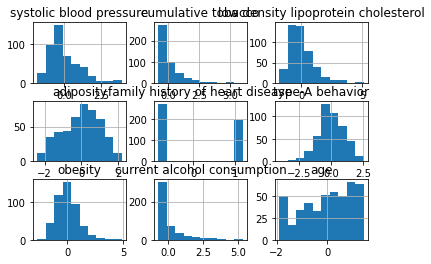

In [783]:
X_scaled.hist()

In [784]:
C, S = SUBCLU(X_scaled_no_bin, eps=0.5, m=5)

Computing 2-dim clusters


  0%|          | 0/28 [00:00<?, ?it/s]

Computing 3-dim clusters


  0%|          | 0/56 [00:00<?, ?it/s]

Computing 4-dim clusters


  0%|          | 0/70 [00:00<?, ?it/s]

Computing 5-dim clusters


  0%|          | 0/56 [00:00<?, ?it/s]

Computing 6-dim clusters
pruning candidate :  frozenset({'type-A behavior', 'systolic blood pressure', 'obesity', 'cumulative tobacco', 'low density lipoprotein cholesterol', 'adiposity'})
pruning candidate :  frozenset({'type-A behavior', 'systolic blood pressure', 'obesity', 'low density lipoprotein cholesterol', 'current alcohol consumption', 'adiposity'})
pruning candidate :  frozenset({'type-A behavior', 'age', 'systolic blood pressure', 'obesity', 'low density lipoprotein cholesterol', 'adiposity'})
pruning candidate :  frozenset({'age', 'type-A behavior', 'systolic blood pressure', 'low density lipoprotein cholesterol', 'current alcohol consumption', 'adiposity'})
pruning candidate :  frozenset({'type-A behavior', 'age', 'systolic blood pressure', 'obesity', 'cumulative tobacco', 'low density lipoprotein cholesterol'})
pruning candidate :  frozenset({'type-A behavior', 'age', 'systolic blood pressure', 'cumulative tobacco', 'low density lipoprotein cholesterol', 'adiposity'})
pr

  0%|          | 0/19 [00:00<?, ?it/s]

Computing 7-dim clusters
pruning candidate :  frozenset({'age', 'type-A behavior', 'systolic blood pressure', 'obesity', 'cumulative tobacco', 'low density lipoprotein cholesterol', 'adiposity'})
pruning candidate :  frozenset({'type-A behavior', 'age', 'obesity', 'cumulative tobacco', 'low density lipoprotein cholesterol', 'current alcohol consumption', 'adiposity'})
pruning candidate :  frozenset({'type-A behavior', 'age', 'systolic blood pressure', 'obesity', 'low density lipoprotein cholesterol', 'current alcohol consumption', 'adiposity'})
pruning candidate :  frozenset({'type-A behavior', 'systolic blood pressure', 'obesity', 'cumulative tobacco', 'low density lipoprotein cholesterol', 'current alcohol consumption', 'adiposity'})
pruning candidate :  frozenset({'age', 'type-A behavior', 'systolic blood pressure', 'obesity', 'cumulative tobacco', 'low density lipoprotein cholesterol', 'current alcohol consumption'})
pruning candidate :  frozenset({'type-A behavior', 'age', 'systol

  0%|          | 0/2 [00:00<?, ?it/s]

Computing 8-dim clusters
pruning candidate :  frozenset({'age', 'type-A behavior', 'systolic blood pressure', 'obesity', 'cumulative tobacco', 'low density lipoprotein cholesterol', 'current alcohol consumption', 'adiposity'})


0it [00:00, ?it/s]

In [806]:
C_minmax, S_minmax = SUBCLU(X_min_max_no_bin, eps=0.5, m=5)

Computing 2-dim clusters


  0%|          | 0/28 [00:00<?, ?it/s]

Computing 3-dim clusters


  0%|          | 0/56 [00:00<?, ?it/s]

Computing 4-dim clusters


  0%|          | 0/70 [00:00<?, ?it/s]

Computing 5-dim clusters


  0%|          | 0/56 [00:00<?, ?it/s]

Computing 6-dim clusters


  0%|          | 0/28 [00:00<?, ?it/s]

Computing 7-dim clusters


  0%|          | 0/8 [00:00<?, ?it/s]

Computing 8-dim clusters


  0%|          | 0/1 [00:00<?, ?it/s]

Computing 9-dim clusters


0it [00:00, ?it/s]

In [788]:
Q = allSubspacesQuality(X = X_scaled_no_bin, S=[s for sublist in S for s in sublist], eps=0.5, m=5)

In [789]:
df_C = clusters_list_to_dataframe(C, Q)

In [742]:
with pd.option_context("display.max_rows",None,"display.max_colwidth",None):
    display(df_C.sort_values("Subspace quality",ascending=False).drop("Cluster",axis=1))

,Number of instances,Subspace,Subspace quality,Subspace size,Indices
541,4,"{obesity, adiposity, age, cumulative tobacco}",0.004709,4,"Int64Index([5, 314, 332, 442], dtype='int64')"
258,77,"{current alcohol consumption, obesity, adiposity, age}",0.004709,4,"Int64Index([ 8, 12, 13, 20, 38, 41, 42, 56, 58, 60, 64, 67, 70, 73, 84, 90, 109, 110, 121, 132, 136, 137, 138, 146, 152, 153, 156, 160, 162, 163, 164, 168, 171, 177, 194, 195, 196, 199, 206, 214, 217, 218, 220, 233, 239, 251, 260, 261, 265, 266, 278, 279, 283, 285, 287, 288, 290, 291, 296, 297, 304, 327, 330, 367, 395, 430, 432, 433, 434, 435, 436, 437, 441, 445, 447, 448, 451], dtype='int64')"
538,10,"{obesity, adiposity, age, cumulative tobacco}",0.004709,4,"Int64Index([28, 32, 133, 207, 236, 244, 249, 299, 337, 458], dtype='int64')"
542,3,"{obesity, adiposity, age, cumulative tobacco}",0.004709,4,"Int64Index([82, 98, 387], dtype='int64')"
537,275,"{obesity, adiposity, age, cumulative tobacco}",0.004709,4,"Int64Index([ 1, 2, 6, 8, 9, 12, 13, 15, 18, 20, ... 444, 446, 447, 448, 451, 452, 454, 455, 457, 460], dtype='int64', length=275)"
540,4,"{obesity, adiposity, age, cumulative tobacco}",0.004709,4,"Int64Index([16, 100, 151, 165], dtype='int64')"
257,12,"{current alcohol consumption, obesity, adiposity, age}",0.004709,4,"Int64Index([6, 69, 75, 88, 112, 145, 192, 328, 368, 428, 438, 439], dtype='int64')"
256,201,"{current alcohol consumption, obesity, adiposity, age}",0.004709,4,"Int64Index([ 1, 2, 9, 11, 14, 15, 19, 21, 22, 23, ... 424, 429, 440, 443, 446, 452, 454, 457, 458, 460], dtype='int64', length=201)"
259,5,"{current alcohol consumption, obesity, adiposity, age}",0.004709,4,"Int64Index([27, 106, 118, 203, 355], dtype='int64')"
260,6,"{current alcohol consumption, obesity, adiposity, age}",0.004709,4,"Int64Index([78, 123, 130, 135, 188, 258], dtype='int64')"


## Avec Family history

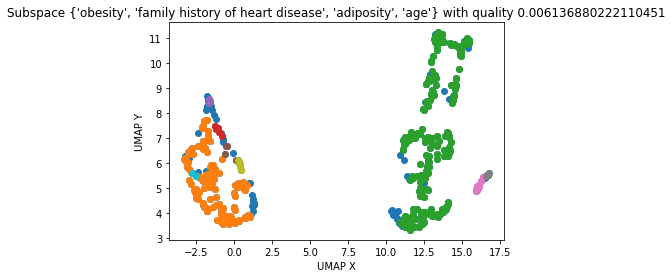

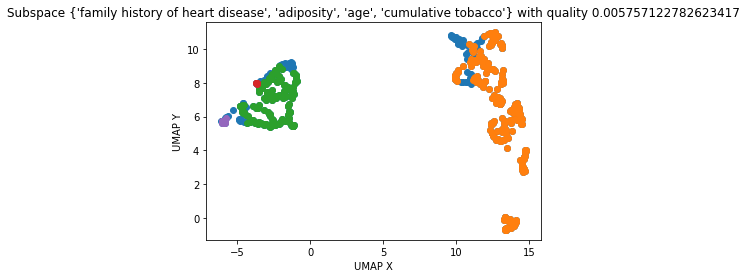

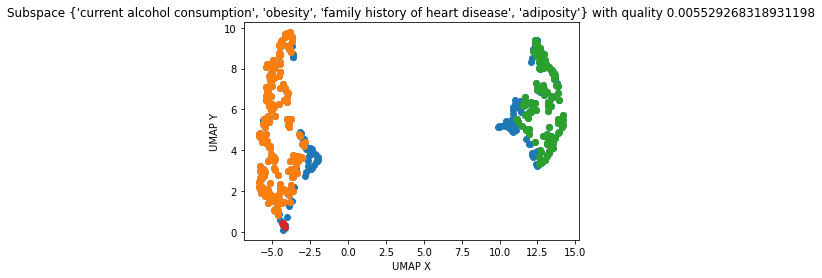

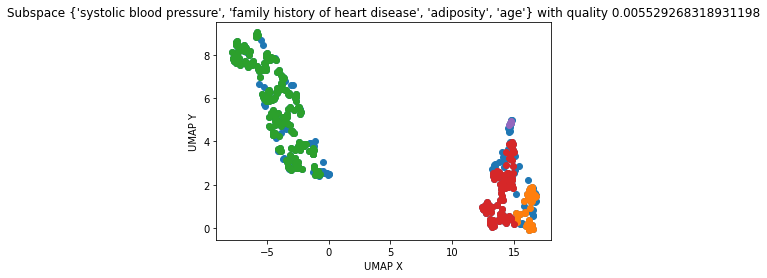

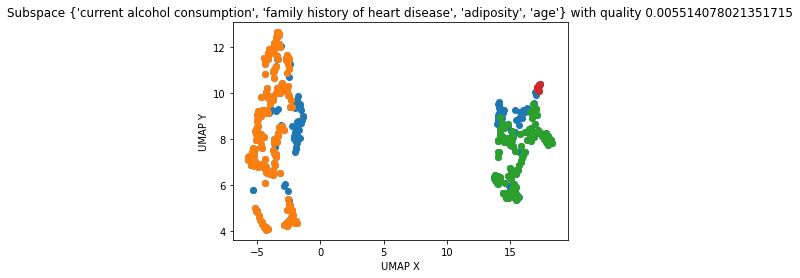

...

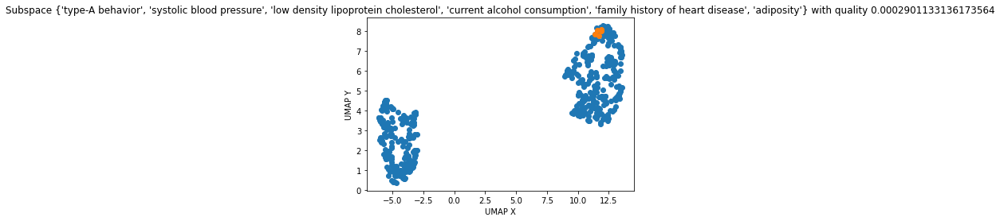

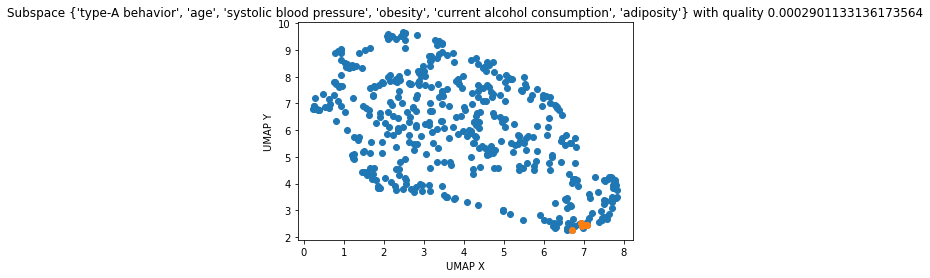

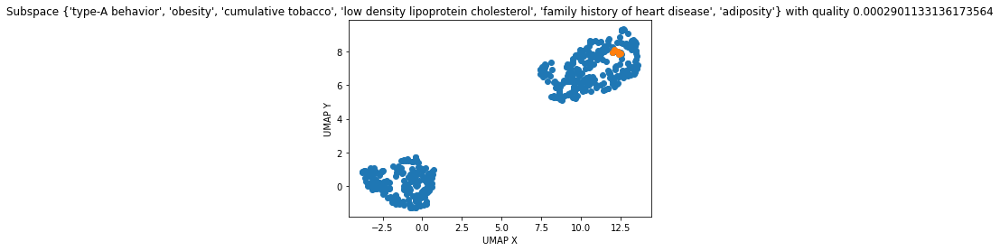

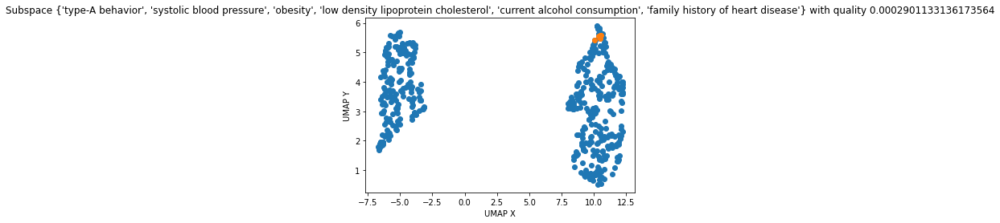

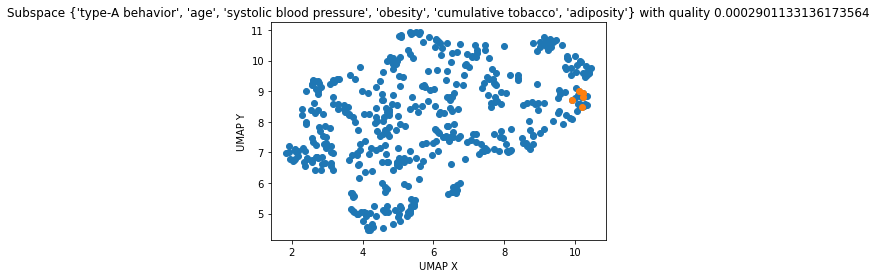

In [756]:
draw_subspaces_clusters(X,df_C)

## Sans Family history

In [827]:
np.log(X.shape[0])

6.135564891081739

In [864]:
eps = 0.2
m=10
C_scaled_no_bin, S_scaled_no_bin = SUBCLU(X_scaled_no_bin, eps=0.2, m=5)

Q = allSubspacesQuality(X = X_scaled_no_bin, S=[s for sublist in S_minmax for s in sublist], eps=0.2, m=5)

df_C_scaled_no_bin = clusters_list_to_dataframe(C_minmax, Q)

Computing 2-dim clusters


  0%|          | 0/28 [00:00<?, ?it/s]

Computing 3-dim clusters


  0%|          | 0/56 [00:00<?, ?it/s]

Computing 4-dim clusters
pruning candidate :  frozenset({'age', 'type-A behavior', 'systolic blood pressure', 'obesity'})
pruning candidate :  frozenset({'current alcohol consumption', 'type-A behavior', 'age', 'adiposity'})
pruning candidate :  frozenset({'type-A behavior', 'age', 'adiposity', 'low density lipoprotein cholesterol'})
pruning candidate :  frozenset({'current alcohol consumption', 'age', 'type-A behavior', 'obesity'})
pruning candidate :  frozenset({'type-A behavior', 'age', 'obesity', 'cumulative tobacco'})
pruning candidate :  frozenset({'age', 'type-A behavior', 'obesity', 'adiposity'})
pruning candidate :  frozenset({'age', 'type-A behavior', 'obesity', 'low density lipoprotein cholesterol'})
pruning candidate :  frozenset({'age', 'type-A behavior', 'systolic blood pressure', 'adiposity'})
pruning candidate :  frozenset({'type-A behavior', 'age', 'adiposity', 'cumulative tobacco'})


  0%|          | 0/61 [00:00<?, ?it/s]

Computing 5-dim clusters
pruning candidate :  frozenset({'age', 'obesity', 'low density lipoprotein cholesterol', 'current alcohol consumption', 'adiposity'})
pruning candidate :  frozenset({'age', 'type-A behavior', 'obesity', 'cumulative tobacco', 'current alcohol consumption'})
pruning candidate :  frozenset({'age', 'type-A behavior', 'obesity', 'low density lipoprotein cholesterol', 'current alcohol consumption'})
pruning candidate :  frozenset({'type-A behavior', 'age', 'cumulative tobacco', 'low density lipoprotein cholesterol', 'adiposity'})
pruning candidate :  frozenset({'type-A behavior', 'age', 'obesity', 'cumulative tobacco', 'low density lipoprotein cholesterol'})
pruning candidate :  frozenset({'systolic blood pressure', 'obesity', 'low density lipoprotein cholesterol', 'current alcohol consumption', 'adiposity'})
pruning candidate :  frozenset({'age', 'type-A behavior', 'systolic blood pressure', 'low density lipoprotein cholesterol', 'current alcohol consumption'})
prun

  0%|          | 0/6 [00:00<?, ?it/s]

Computing 6-dim clusters
pruning candidate :  frozenset({'age', 'type-A behavior', 'cumulative tobacco', 'low density lipoprotein cholesterol', 'current alcohol consumption', 'adiposity'})
pruning candidate :  frozenset({'age', 'type-A behavior', 'obesity', 'cumulative tobacco', 'low density lipoprotein cholesterol', 'current alcohol consumption'})
pruning candidate :  frozenset({'age', 'systolic blood pressure', 'obesity', 'cumulative tobacco', 'current alcohol consumption', 'adiposity'})
pruning candidate :  frozenset({'age', 'obesity', 'cumulative tobacco', 'low density lipoprotein cholesterol', 'current alcohol consumption', 'adiposity'})
pruning candidate :  frozenset({'age', 'systolic blood pressure', 'obesity', 'cumulative tobacco', 'low density lipoprotein cholesterol', 'current alcohol consumption'})
pruning candidate :  frozenset({'age', 'systolic blood pressure', 'cumulative tobacco', 'low density lipoprotein cholesterol', 'current alcohol consumption', 'adiposity'})


0it [00:00, ?it/s]

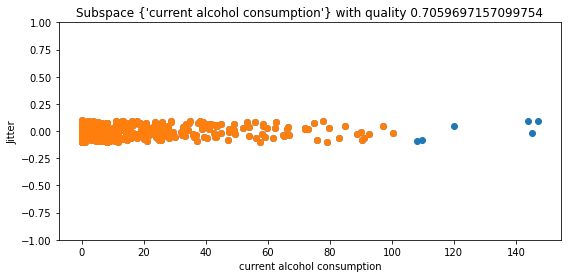

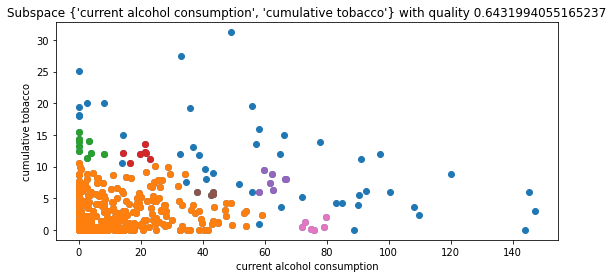

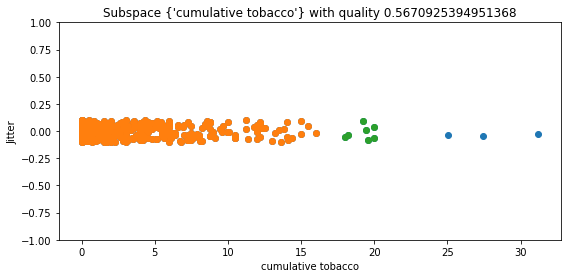

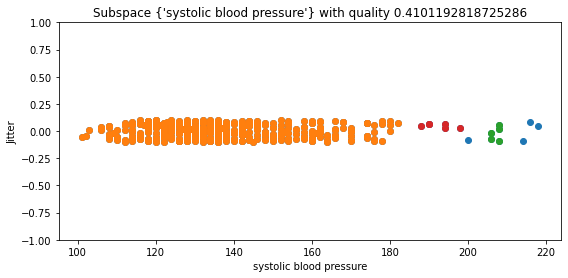

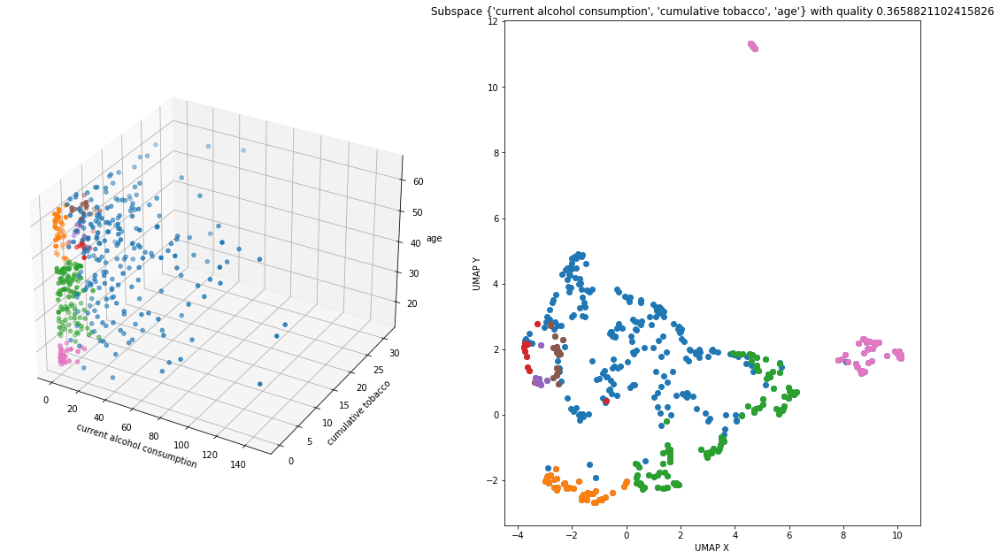

...

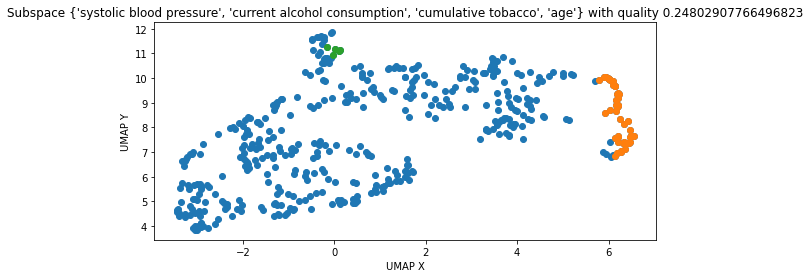

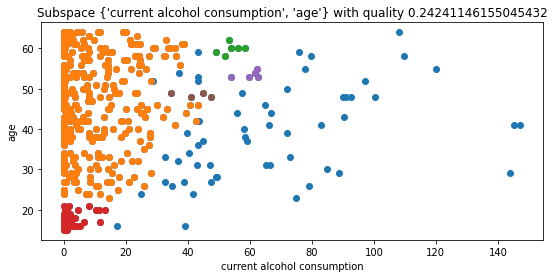

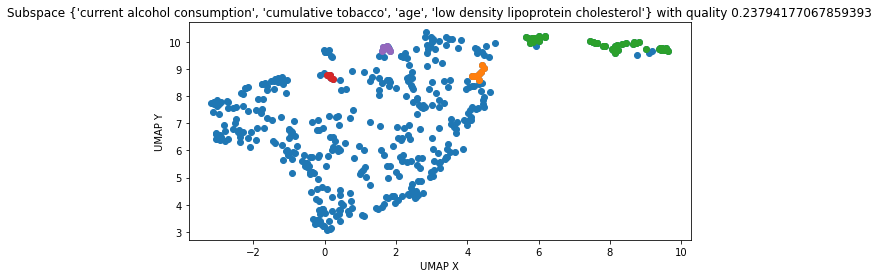

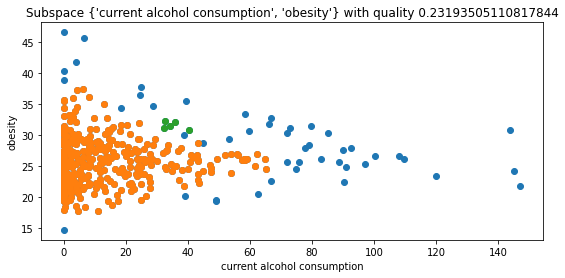

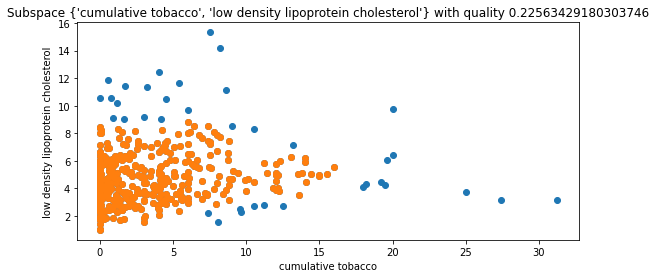

In [895]:
draw_subspaces_clusters(X.drop("family history of heart disease",axis=1),df_C_scaled_no_bin,limit=20)

In [893]:
plt.rcParams['axes.prop_cycle'].by_key()['color']

['#1f77b4',
 '#ff7f0e',
 '#2ca02c',
 '#d62728',
 '#9467bd',
 '#8c564b',
 '#e377c2',
 '#7f7f7f',
 '#bcbd22',
 '#17becf']

## MinMax

In [816]:
C_minmax, S_minmax = SUBCLU(X_min_max_no_bin, eps=0.05, m=5)

Q = allSubspacesQuality(X = X_min_max_no_bin, S=[s for sublist in S_minmax for s in sublist], eps=0.05, m=5)

df_C_minmax = clusters_list_to_dataframe(C_minmax, Q)

Computing 2-dim clusters


  0%|          | 0/28 [00:00<?, ?it/s]

Computing 3-dim clusters


  0%|          | 0/56 [00:00<?, ?it/s]

Computing 4-dim clusters


  0%|          | 0/70 [00:00<?, ?it/s]

Computing 5-dim clusters
pruning candidate :  frozenset({'type-A behavior', 'age', 'systolic blood pressure', 'obesity', 'cumulative tobacco'})
pruning candidate :  frozenset({'type-A behavior', 'age', 'obesity', 'low density lipoprotein cholesterol', 'current alcohol consumption'})
pruning candidate :  frozenset({'type-A behavior', 'age', 'cumulative tobacco', 'low density lipoprotein cholesterol', 'adiposity'})
pruning candidate :  frozenset({'type-A behavior', 'age', 'obesity', 'cumulative tobacco', 'low density lipoprotein cholesterol'})
pruning candidate :  frozenset({'type-A behavior', 'age', 'systolic blood pressure', 'cumulative tobacco', 'adiposity'})
pruning candidate :  frozenset({'age', 'type-A behavior', 'systolic blood pressure', 'low density lipoprotein cholesterol', 'current alcohol consumption'})
pruning candidate :  frozenset({'type-A behavior', 'age', 'low density lipoprotein cholesterol', 'current alcohol consumption', 'adiposity'})
pruning candidate :  frozenset({'

  0%|          | 0/26 [00:00<?, ?it/s]

Computing 6-dim clusters
pruning candidate :  frozenset({'age', 'systolic blood pressure', 'obesity', 'cumulative tobacco', 'low density lipoprotein cholesterol', 'adiposity'})
pruning candidate :  frozenset({'type-A behavior', 'age', 'cumulative tobacco', 'low density lipoprotein cholesterol', 'current alcohol consumption', 'adiposity'})
pruning candidate :  frozenset({'age', 'type-A behavior', 'obesity', 'cumulative tobacco', 'low density lipoprotein cholesterol', 'current alcohol consumption'})
pruning candidate :  frozenset({'type-A behavior', 'obesity', 'cumulative tobacco', 'low density lipoprotein cholesterol', 'current alcohol consumption', 'adiposity'})
pruning candidate :  frozenset({'age', 'systolic blood pressure', 'obesity', 'cumulative tobacco', 'current alcohol consumption', 'adiposity'})
pruning candidate :  frozenset({'type-A behavior', 'age', 'systolic blood pressure', 'cumulative tobacco', 'current alcohol consumption', 'adiposity'})
pruning candidate :  frozenset({'

  0%|          | 0/1 [00:00<?, ?it/s]

Computing 7-dim clusters


0it [00:00, ?it/s]

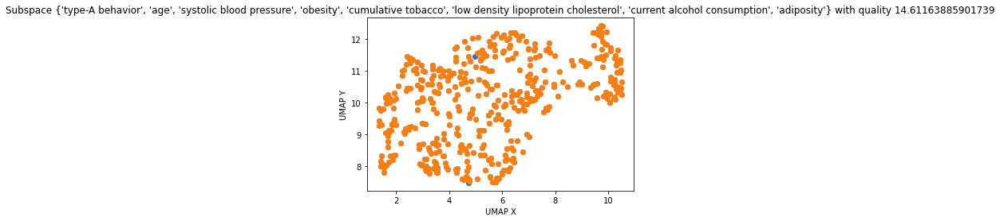

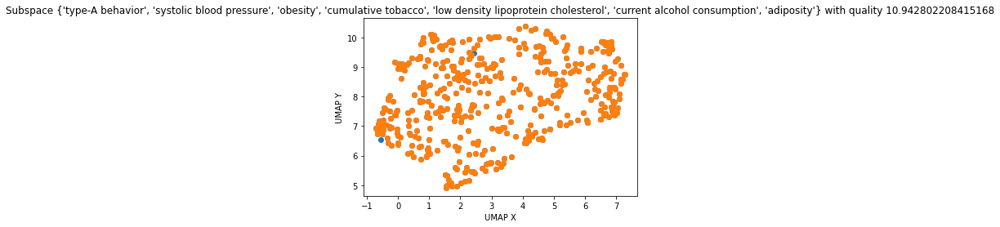

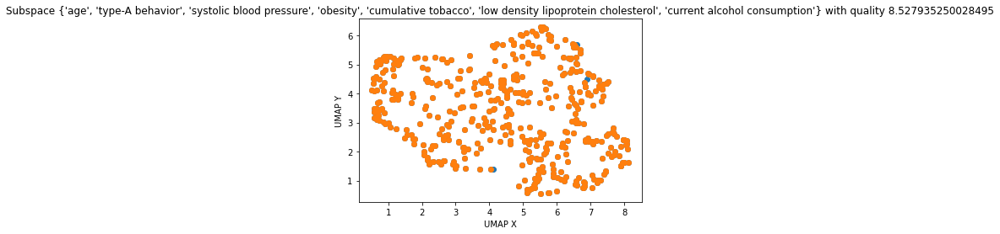

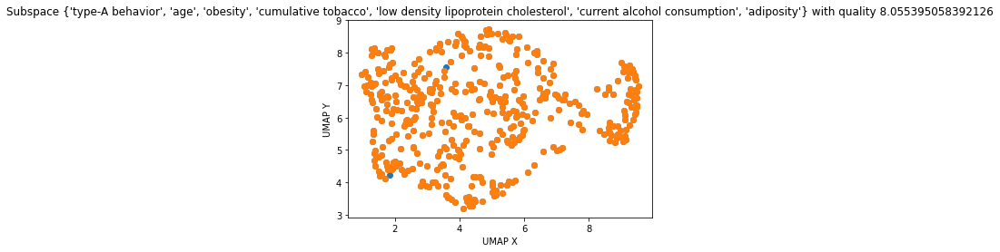

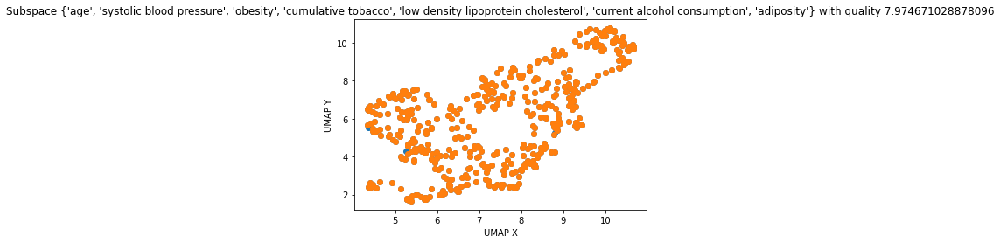

...

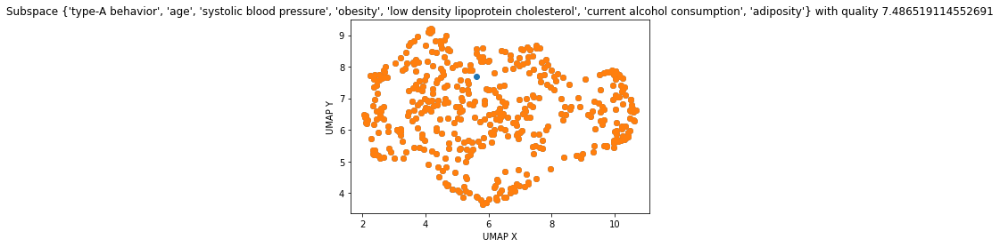

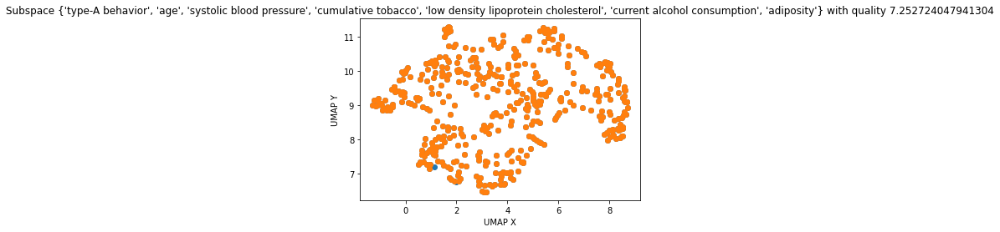

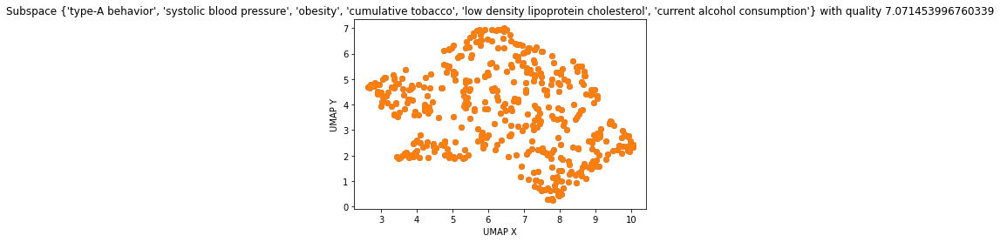

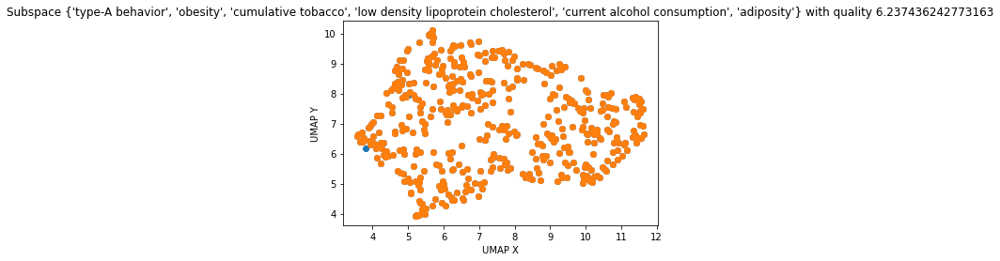

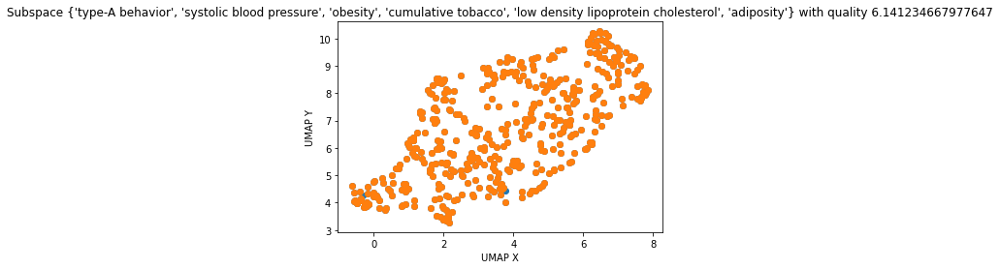

KeyboardInterrupt: 

<Figure size 432x288 with 0 Axes>

In [817]:
draw_subspaces_clusters(X.drop("family history of heart disease",axis=1),df_C)

# Viz métriques

In [791]:
def volde(d,eps):
    return (math.sqrt(math.pi**d)/gamma(d/2+1)) * eps**d

In [801]:
list(map(lambda x:volde(x,0.5), range(1,10)))

[1.0,
 0.7853981633974483,
 0.5235987755982989,
 0.30842513753404244,
 0.16449340668482262,
 0.08074551218828077,
 0.03691223414321407,
 0.0158543442438155,
 0.006442400200661535]

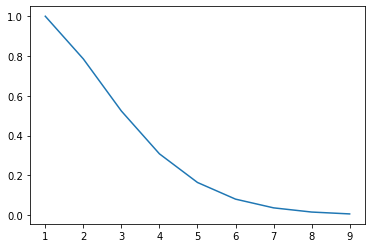

In [803]:
plt.plot(range(1,10),list(map(lambda x:volde(x,0.5), range(1,10))))